In [1]:
# %pip install pynrrd numpy matplotlib ipywidgets scikit-image opencv-python scipy plotly

Env will still require:
conda install -c conda-forge graph-tool 

In [2]:
import nrrd
import numpy as np
import os
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider
from skimage.segmentation import mark_boundaries
import cv2
from scipy import ndimage as ndi
from helper import *
import graph_tool.all as gt
import plotly.graph_objects as go
from multiprocessing import Pool, cpu_count

current_directory = os.getcwd()
label_path = f"{current_directory}/data/label/manual_1_label.nrrd"
label_path = f"{current_directory}/data/label/slices_0_512_h3_w7_mask.nrrd"
raw_data_path = f"{current_directory}/data/raw/manual_1_raw.nrrd"
raw_data_path = f"{current_directory}/data/raw/slices_0_512_h3_w7.nrrd"

mask_data, mask_header = nrrd.read(label_path)
raw_data, raw_header = nrrd.read(raw_data_path)

FileNotFoundError: [Errno 2] No such file or directory: '/Users/jamesdarby/Documents/VesuviusScroll/GP/3D_sheet_carving/data/label/slices_0_512_h3_w7_mask.nrrd'

In [ ]:
#plot label ontop of raw data
def plot_slice(slice_index, axis=0):
    plt.figure(figsize=(8, 6))
    if axis == 1:
        plt.imshow(mark_boundaries_color(raw_data[:,slice_index,:], mask_data[:,slice_index,:]))
    elif axis == 2:
        plt.imshow(mark_boundaries_color(raw_data[:,:,slice_index], mask_data[:,:,slice_index]))
    else:
        plt.imshow(mark_boundaries_color(raw_data[slice_index,:,:], mask_data[slice_index,:,:]))
    plt.colorbar()
    plt.title(f'Slice {slice_index}')
    plt.show()

# Create a slider to browse through slices
interact(plot_slice, slice_index=IntSlider(min=0, max=mask_data.shape[0]-1, step=1, value=0), axis=IntSlider(min=0, max=2, step=1, value=0))

interactive(children=(IntSlider(value=0, description='slice_index', max=255), IntSlider(value=0, description='…

<function __main__.plot_slice(slice_index, axis=0)>

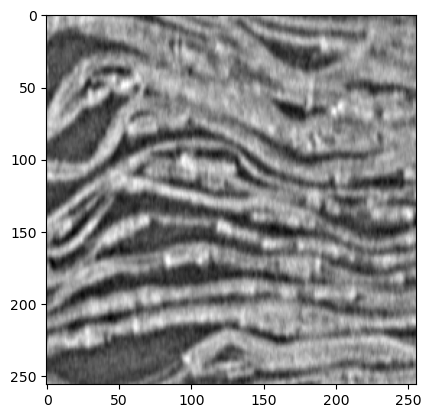

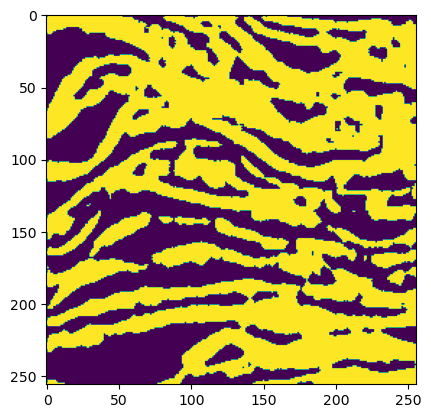

In [ ]:
test_slice = raw_data[0,:,:]
test_mask = mask_data[0,:,:]
plt.imshow(test_slice, cmap='gray')
plt.show()
plt.imshow(test_mask)
plt.show()

In [ ]:
reduction_factor = 4
reduced_mask_data = reduce_array(mask_data, (reduction_factor,reduction_factor,reduction_factor), method='mean')
reduced_raw_data = reduce_array(raw_data, (reduction_factor,reduction_factor,reduction_factor), method='mean')
print(mask_data.shape, reduced_mask_data.shape)

(256, 256, 256) (64, 64, 64)


In [ ]:
#plot the test_data mask
test_data = reduced_mask_data
def plot_slices(slice_idx_1, slice_idx_2, axis=0):
    plt.figure(figsize=(16, 6))
    
    # Plot test_data
    plt.subplot(1, 2, 1)
    if axis == 1:
        plt.imshow(test_data[:, slice_idx_1, :])
    elif axis == 2:
        plt.imshow(test_data[:, :, slice_idx_1])
    else:
        plt.imshow(test_data[slice_idx_1, :, :])
    plt.colorbar()
    plt.title(f'test_data Slice {slice_idx_1}')
    
    # Plot mask_data
    plt.subplot(1, 2, 2)
    if axis == 1:
        plt.imshow(mask_data[:, slice_idx_2, :])
    elif axis == 2:
        plt.imshow(mask_data[:, :, slice_idx_2])
    else:
        plt.imshow(mask_data[slice_idx_2, :, :])
    plt.colorbar()
    plt.title(f'mask_data Slice {slice_idx_2}')
    
    plt.show()


# Create a slider to browse through slices
interact(plot_slices, slice_idx_1=IntSlider(min=0, max=test_data.shape[0]-1, step=1, value=0), slice_idx_2=IntSlider(min=0, max=mask_data.shape[0]-1, step=1, value=0), axis=IntSlider(min=0, max=2, step=1, value=0))

interactive(children=(IntSlider(value=0, description='slice_idx_1', max=63), IntSlider(value=0, description='s…

<function __main__.plot_slices(slice_idx_1, slice_idx_2, axis=0)>

In [ ]:
#plot the test_data
def plot_slices(slice_idx_1, slice_idx_2, axis=0):
    plt.figure(figsize=(16, 6))
    
    # Plot test_data
    plt.subplot(1, 2, 1)
    if axis == 1:
        plt.imshow(reduced_raw_data[:, slice_idx_1, :],cmap='grey')
    elif axis == 2:
        plt.imshow(reduced_raw_data[:, :, slice_idx_1],cmap='grey')
    else:
        plt.imshow(reduced_raw_data[slice_idx_1, :, :],cmap='grey')
    plt.colorbar()
    plt.title(f'test_data Slice {slice_idx_1}')
    
    # Plot mask_data
    plt.subplot(1, 2, 2)
    if axis == 1:
        plt.imshow(raw_data[:, slice_idx_2, :],cmap='grey')
    elif axis == 2:
        plt.imshow(raw_data[:, :, slice_idx_2],cmap='grey')
    else:
        plt.imshow(raw_data[slice_idx_2, :, :],cmap='grey')
    plt.colorbar()
    plt.title(f'mask_data Slice {slice_idx_2}')
    
    plt.show()


# Create a slider to browse through slices
interact(plot_slices, slice_idx_1=IntSlider(min=0, max=reduced_raw_data.shape[0]-1, step=1, value=0), slice_idx_2=IntSlider(min=0, max=mask_data.shape[0]-1, step=1, value=0), axis=IntSlider(min=0, max=2, step=1, value=0))

interactive(children=(IntSlider(value=0, description='slice_idx_1', max=63), IntSlider(value=0, description='s…

<function __main__.plot_slices(slice_idx_1, slice_idx_2, axis=0)>

In [ ]:
#full scale code 
#left, front, back, does a left to right slice, and is the only one that works at the moment...
#thus rotate array to get different graph rotations

axis = 1 #0 for x, 1 for y and 2 for z
k = 1 # number of times to rotate the array
#due to the direction and symmetry, only a single rotation 
# on y and z along with the original is needed to get the best cut
reduced_mask_data_t = np.rot90(reduced_mask_data, k=k,  axes=(axis, (axis+1)%3))
reduced_raw_data_t = np.rot90(reduced_raw_data, k=k, axes=(axis, (axis+1)%3))

directed_graph, wp = create_directed_energy_graph_from_mask(reduced_mask_data_t)

dim = reduced_mask_data.shape[0]
z, y, x = dim, dim, dim  # Dimensions of the graph
directed_graph, source, sink, weights = add_directed_source_sink(directed_graph, z, y, x)

src, tgt = directed_graph.vertex(source), directed_graph.vertex(sink)
print(src, tgt)
#1m 46s for 128^3
#12s for 64^3

64 64 64
262144 262145


In [ ]:
# Compute the residual capactiy of the edges
res = gt.boykov_kolmogorov_max_flow(directed_graph, src, tgt, weights) #time complexity: edges * vertices^2 * abs(min cut) 

#use the residual graph to get the max flow
flow = sum(weights[e] - res[e] for e in tgt.in_edges())
print("The maximum flow from source to sink is:", flow)

# Determine the minimum cut partition
part = gt.min_st_cut(directed_graph, src, weights, res)
print("The number of vertices in the partiton:", sum(part))

# Find the boundary vertices
boundary_vertices = find_boundary_vertices(np.array(directed_graph.get_edges()), part)
print("Number of boundary vertices:", len(boundary_vertices))

The maximum flow from source to sink is: 7084
The number of vertices in the partiton: 197668
1540352
13232
Number of boundary vertices: 13232


In [ ]:
test_size = test_data.shape[0]
shape = (test_size, test_size, test_size)

# Convert the boundary vertices to a 3D array
boundary_array = boundary_vertices_to_array(boundary_vertices, shape, 'x')
print("Boundary points marked:", np.sum(boundary_array))

Boundary points marked: 4096


In [ ]:
if reduced_mask_data_t.shape[0] <= 64:
    # Plot the 3d boundary array with plotly
    showAll = False
    # Define the grid dimensions
    x_dim, y_dim, z_dim = boundary_array.shape
    x, y, z = np.indices((x_dim, y_dim, z_dim))

    # Flatten the data
    x, y, z = x.flatten(), y.flatten(), z.flatten()
    if showAll:
        # vis_data = np.copy(test_data)
        vis_data = np.where(reduced_mask_data_t != 0, 1, 0)
        vis_data[boundary_array == 1] = 2
    else:
        vis_data = boundary_array

    values = vis_data.flatten()

    # Calculate the linear index using C-style row-major order
    index = lambda i, j, k: i * y_dim * z_dim + j * z_dim + k
    indices = [index(i, j, k) for i, j, k in zip(x, y, z)]

    # Create a scatter plot
    fig = go.Figure(data=[go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='markers',
        marker=dict(
            size=1,
            color=values,
            # colorscale='Viridis',
            colorbar=dict(title='Color Scale'),
            # opacity=0.8
            colorscale=[[0, 'rgba(0, 0, 0, 0)'], [0.5, 'blue'], [1.0, 'red']],  # Blue for 1, transparent for 0
            # opacity=[1 if value == 1 else 0 for value in values]  # Fully opaque for 1, fully transparent for 0
        )
    )])

    # Update layout to remove background grids and keep axes fixed
    fig.update_layout(scene=dict(
        xaxis=dict(showbackground=False, showgrid=False, showline=True, zeroline=True),
        yaxis=dict(showbackground=False, showgrid=False, showline=True, zeroline=True),
        zaxis=dict(showbackground=False, showgrid=False, showline=True, zeroline=True)
    ))

    fig.show()


In [ ]:
def plot_slice(slice_index, axis=0):
    plt.figure(figsize=(8, 6))
    if axis == 1:
        plt.imshow(mark_boundaries_color(reduced_raw_data_t[:,slice_index,:], boundary_array[:,slice_index,:]))
    elif axis == 2:
        plt.imshow(mark_boundaries_color(reduced_raw_data_t[:,:,slice_index], boundary_array[:,:,slice_index]))
    else:
        plt.imshow(mark_boundaries_color(reduced_raw_data_t[slice_index,:,:], boundary_array[slice_index,:,:]))
    plt.colorbar()
    plt.title(f'Slice {slice_index}')
    plt.show()

print("Flow:", flow, " (lower flow should mean a better cut)")    
print(reduced_raw_data_t.max(), reduced_raw_data_t.min())
# Create a slider to browse through slices
interact(plot_slice, slice_index=IntSlider(min=0, max=reduced_raw_data.shape[0]-1, step=1, value=0), axis=IntSlider(min=0, max=2, step=1, value=0))

Flow: 7084  (lower flow should mean a better cut)
65535 9345


interactive(children=(IntSlider(value=0, description='slice_index', max=63), IntSlider(value=0, description='a…

<function __main__.plot_slice(slice_index, axis=0)>

: 